In [1]:
import sys
import numpy as np
import pandas as pd
from pathlib import Path
sys.path.append("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/src/")
# from hmm_NB_BB_phaseswitch import *
from utils_phase_switch import *
from sklearn.metrics import adjusted_rand_score
from hmm_gaussian import *

from matplotlib import pyplot as plt
import seaborn
plt.rcParams.update({'font.size': 14})

# A29

### Load data from .bb file and convert to RDR+BAF matrix

In [2]:
##### load another data #####
dir = "/n/fs/ragr-research/projects/hatchet2-results/gundem/A29/"

unique_chrs = np.arange(1, 23)

df_all = pd.read_csv(f"{dir}/bb/bulk.bb", header=0, sep="\t")
df_all.iloc[:,0] = pd.Categorical(df_all.iloc[:,0], categories=unique_chrs, ordered=True)
df_all.sort_values(by=["#CHR", "START"], inplace=True)
df_all

,#CHR,START,END,SAMPLE,RD,#SNPS,COV,ALPHA,BETA,BAF,TOTAL_READS,NORMAL_READS,CORRECTED_READS
0,1,1,870990,A29-A,1.005629,113,44.451327,3571,1452,0.290005,213666.0,108894.0,109507.0
1,1,1,870990,A29-C,1.022196,113,55.159292,4375,1858,0.297395,218132.0,108894.0,111311.0
2,1,870990,974190,A29-A,0.816679,127,39.393701,3723,1280,0.255898,46452.0,29151.0,23807.0
3,1,870990,974190,A29-C,0.952798,127,46.157480,4323,1539,0.262538,54430.0,29151.0,27775.0
4,1,974190,1073498,A29-A,0.813149,138,36.340580,3685,1330,0.265204,43272.0,27273.0,22177.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25189,22,50821763,50996152,A29-C,0.803512,131,42.000000,3359,2143,0.389964,82848.0,52614.0,42276.0
25190,22,50996152,51096321,A29-A,0.770810,114,44.649123,2905,2185,0.430087,47700.0,31716.0,24447.0
25191,22,50996152,51096321,A29-C,0.812870,114,47.938596,3241,2224,0.406742,50523.0,31716.0,25781.0
25192,22,51096321,51304567,A29-A,0.816196,117,44.794872,3037,2204,0.420986,66646.0,41849.0,34157.0


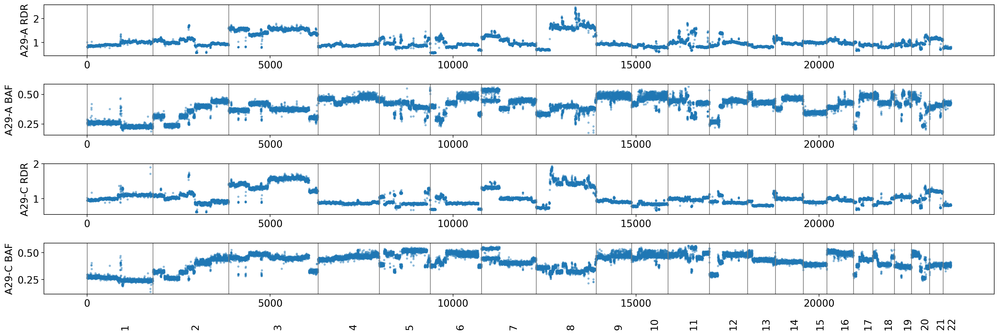

In [3]:
"""
The inputs to HMM consist of:
    X : (n_bins, 2, n_samples)
        X[:,0,s] is the RDR vector for sample s, and X[:,1,s] is the BAF vector for sample s.
    lengths : (n_chromosomes,)
        lengths[c] is the number of bins in chromosome c, chromosomes are ordered in the same way as the first dimension of X.
    log_phaseswitch_prob : (n_bins,)
        Log probability of switching phases between adjacent bins. I use log(0.5) for all adjacent bins.
"""

sample_list = np.unique(df_all["SAMPLE"].values)
n_samples = len(sample_list)

X = np.zeros((df_all[df_all["SAMPLE"] == sample_list[0]].shape[0], 2, n_samples))
for s,sname in enumerate(sample_list):
    X[:,0,s] = df_all[df_all["SAMPLE"] == sname].RD.values
    X[:,1,s] = df_all[df_all["SAMPLE"] == sname].BAF.values


log_sitewise_transmat = np.ones(X.shape[0]) * np.log(0.5)

lengths = np.array([np.sum(df_all[df_all["SAMPLE"] == sample_list[0]]["#CHR"] == c) for c in unique_chrs])

# plotting the data
fig, axes = plt.subplots(4, 1, figsize=(20,7), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.show()


In [4]:
# running HMM

# important parameters
n_states = 15 # number of HMM copy number states
params="smp" # which parameter to infer, "s" for start probability, "m" for RDR mean, "p" for BAF mean. I fix copy number state transitions using the following t parameter.
t = 1-1e-12 # t is the self-transition probability of copy number state.

# other parameters that may not be that important
# shared_rdr_std: whether the RDR Gaussian variance parameters are shared across states.
# shared_p_std: whether the BAF Gaussian variance parameters are shared across states.
# init_rdr_mean, init_p_mean, init_rdr_std, init_p_std: initialization of the Gaussian mean and variance parameters for RDR/BAF. If None, I'll initialize by 1-step GMM run.
# max_iter: maximum number of EM iterations to perform.
# tol: convergence criteria.

# Return:
# res is a dictionary with the following entries.
# res["new_rdr_mean"]: (n_states, n_samples) matrix for the RDR mean per copy number state per sample.
# res["new_rdr_std"]: (n_states, n_samples) matrix for the RDR variance per copy number state per sample.
# res["new_p_mean"]: (n_states, n_samples) matrix for the BAF mean per copy number state per sample.
# res["new_p_std"]: (n_states, n_samples) matrix for the BAF variance per copy number state per sample.
# res["new_log_startprob"]: (n_states,) vector for the log of start probability.
# res["new_log_transmat"]: (n_states, n_states) matrix for the log of transition probability among copy number states. (It's the same as the initialization with t if not inferred)
# res["log_gamma"]: (2*n_states, n_bins) matrix for the log of forward-backward probability per joint copy number + phase state per bins. It's shared across samples for concurrent breakpoints.
# res["pred_cnv"]: (n_bins,) vector for the predicted copy number state per bin. Each entry is an index for the n_states.
# res["llf"]: float value for the forward log likelihood of observing X under the parameters.

res = pipeline_gaussian_baum_welch(X, lengths, n_states, log_sitewise_transmat, params=params, t=t, random_state=0, \
    shared_rdr_std=True, shared_p_std=True, init_rdr_mean=None, init_p_mean=None, init_rdr_std=None, init_p_std=None, \
    max_iter=50, tol=1e-4)

/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/sklearn/mixture/_base.py:286: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


init_log_mu = [[1.02238278 1.09733877]
 [0.91745959 0.89310398]
 [1.64155929 1.42592716]
 [0.82116447 0.83159868]
 [0.91697098 1.00645084]
 [0.8981232  0.97774201]
 [1.30791829 1.31183413]
 [1.46511921 0.97484518]
 [1.58437787 1.58783075]
 [1.3596497  1.18193545]
 [0.66898489 0.72475778]
 [0.8320328  0.85732777]
 [1.11412426 1.01732907]
 [0.99036903 0.91854899]
 [1.13618775 1.15963953]]
init_p_mean = [[0.23973407 0.2533338 ]
 [0.46419493 0.48132247]
 [0.37674694 0.37560557]
 [0.42397472 0.41921498]
 [0.45134499 0.42535086]
 [0.25633773 0.27286398]
 [0.43867615 0.51471057]
 [0.33020488 0.53221874]
 [0.3764586  0.43542986]
 [0.33385763 0.35564674]
 [0.34681927 0.36695372]
 [0.44343534 0.4941871 ]
 [0.39962965 0.45636847]
 [0.40669728 0.44771758]
 [0.35102156 0.36274276]]


  2%|██▌                                                                                                                           | 1/50 [00:11<09:40, 11.85s/it]

0.06744445577111495 0.0 0.023646200139564217 0.0124970405582995
[[1.00808003 1.08327578 0.231729   0.24856599]
 [0.91802308 0.91095441 0.4873662  0.49117476]
 [1.67855611 1.46093467 0.38258568 0.34071153]
 [0.81983338 0.85274166 0.42280325 0.40763954]
 [0.93068048 1.01596867 0.45374479 0.41599128]
 [0.89070651 0.97620584 0.26135214 0.27646155]
 [1.31339963 1.31585277 0.47394288 0.50193008]
 [1.44857809 0.96382103 0.32132996 0.54236486]
 [1.55720874 1.51882364 0.37840011 0.45349631]
 [1.37299366 1.21904254 0.30319577 0.32947765]
 [0.67690374 0.73348018 0.34647877 0.36575655]
 [0.852089   0.84731977 0.45571509 0.5063622 ]
 [1.12357921 1.0300181  0.38388333 0.43053804]
 [1.07600079 0.97889012 0.38774668 0.43883666]
 [1.0929124  1.06548201 0.34164994 0.36932688]]


  4%|█████                                                                                                                         | 2/50 [00:14<05:15,  6.57s/it]

0.03033312014397113 0.0 0.013857482568128876 0.005863846743015492
[[1.00931502 1.08500874 0.23143272 0.24813803]
 [0.93428951 0.91396445 0.48441793 0.48996487]
 [1.68852669 1.4732633  0.37890444 0.33708509]
 [0.82435641 0.83870335 0.42384442 0.41491237]
 [0.92452954 1.0001931  0.45119905 0.41276276]
 [0.88848926 0.97370822 0.26063249 0.27566239]
 [1.3095197  1.31550991 0.46144881 0.50458493]
 [1.45083901 0.9753646  0.33222752 0.53027585]
 [1.56357268 1.52297673 0.37317876 0.4527559 ]
 [1.36178575 1.21641264 0.30170276 0.33335127]
 [0.67017638 0.72728014 0.34640213 0.36622946]
 [0.83228128 0.84770768 0.44951709 0.49784254]
 [1.17075222 1.04150818 0.40332807 0.40936824]
 [1.03240982 0.94278681 0.36155141 0.43020189]
 [1.13123769 1.13927232 0.34000004 0.36303424]]


  6%|███████▌                                                                                                                      | 3/50 [00:17<03:49,  4.88s/it]

0.00396553354908914 0.0 0.0029420135556851895 0.0026519636351313206
[[1.01363809 1.09431019 0.23067124 0.24609372]
 [0.94275928 0.91210162 0.47448404 0.48645787]
 [1.68895641 1.47343617 0.37894736 0.33711573]
 [0.83469376 0.84688546 0.43014127 0.41960786]
 [0.92499242 0.99537786 0.45127763 0.415417  ]
 [0.89571992 0.97578566 0.25866423 0.27495589]
 [1.30942254 1.31526273 0.44275778 0.51082375]
 [1.45862771 0.97517664 0.32991823 0.5318669 ]
 [1.56357875 1.52298272 0.37317847 0.45275682]
 [1.36145886 1.21711831 0.30188315 0.33360209]
 [0.66923117 0.72586088 0.34708101 0.36706829]
 [0.83106947 0.85803268 0.44203701 0.495061  ]
 [1.17130302 1.04027649 0.40444452 0.41022543]
 [1.03046715 0.94127462 0.35952867 0.42860144]
 [1.13209673 1.14050402 0.34006847 0.36290265]]


  8%|██████████                                                                                                                    | 4/50 [00:20<03:07,  4.08s/it]

0.002231640166597853 0.0 0.0012921121715874118 0.0010891716363743865
[[1.01598095 1.09775456 0.22992909 0.24497965]
 [0.94389951 0.91113375 0.46663812 0.48296619]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83781453 0.84906373 0.43052066 0.42154972]
 [0.92779498 0.99615811 0.45191966 0.41434506]
 [0.89800427 0.97726673 0.25799322 0.27450643]
 [1.30950161 1.31546258 0.44022808 0.51318511]
 [1.45549431 0.97571802 0.33002797 0.53161825]
 [1.56357874 1.52298271 0.37317847 0.45275681]
 [1.36260426 1.21619129 0.30117844 0.33290115]
 [0.66926195 0.72584198 0.34712018 0.36711187]
 [0.82915011 0.86411188 0.43996894 0.49474823]
 [1.17144914 1.04020828 0.40479742 0.41105765]
 [1.03182938 0.94181109 0.35735014 0.42806396]
 [1.13201746 1.14245808 0.34058296 0.36211134]]


 10%|████████████▌                                                                                                                 | 5/50 [00:23<02:44,  3.65s/it]

5.961501300024615e-05 0.0 0.0013550882894587612 0.0008669385725191159
[[1.01602275 1.09782198 0.2299161  0.2449593 ]
 [0.94335744 0.91147429 0.4631212  0.4800141 ]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83502376 0.85551412 0.43041735 0.42301632]
 [0.93538199 1.00338083 0.45545504 0.40963961]
 [0.89806532 0.977341   0.25799197 0.27451492]
 [1.30953919 1.31550691 0.44014213 0.51337099]
 [1.45588953 0.9756909  0.32986763 0.5316051 ]
 [1.56357869 1.52298266 0.37317846 0.4527568 ]
 [1.36264495 1.21616405 0.3011582  0.33288363]
 [0.66926836 0.72585468 0.347115   0.3671067 ]
 [0.82860734 0.86385109 0.43944622 0.49523974]
 [1.17407644 1.03899375 0.40363309 0.41269411]
 [1.02888964 0.94574411 0.35567393 0.42708328]
 [1.13180983 1.14561554 0.34166945 0.36047784]]


 12%|███████████████                                                                                                               | 6/50 [00:26<02:28,  3.38s/it]

1.2053202344079287e-05 0.0 0.0007083936313526181 0.0006054748613391087
[[1.01601138 1.09780394 0.2299177  0.24496313]
 [0.94348746 0.91192493 0.46176979 0.47810018]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83620194 0.85754512 0.43084919 0.42323982]
 [0.93538557 1.01256545 0.45750777 0.4056623 ]
 [0.89804042 0.97731571 0.25798668 0.27450584]
 [1.30954333 1.31551086 0.44010675 0.51331478]
 [1.45588512 0.97568038 0.3298547  0.53161152]
 [1.56357866 1.52298263 0.37317846 0.4527568 ]
 [1.3626579  1.21616128 0.30115666 0.33288558]
 [0.66930443 0.72587977 0.34711668 0.36711134]
 [0.82845472 0.86371427 0.43931859 0.49547851]
 [1.17128612 1.03845933 0.40340212 0.41648737]
 [1.02614951 0.94415134 0.3543987  0.42478906]
 [1.13177844 1.14573129 0.34171701 0.36041253]]


 14%|█████████████████▋                                                                                                            | 7/50 [00:29<02:17,  3.20s/it]

1.9223087367586007e-05 0.0 0.0018920523503761389 0.0017740636172795846
[[1.01601786 1.09781409 0.22991661 0.24496083]
 [0.94335465 0.91182166 0.46167244 0.47773053]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83617502 0.85763964 0.43093119 0.42327951]
 [0.93561735 1.01266842 0.45770567 0.40556588]
 [0.89803905 0.97729256 0.257974   0.27448884]
 [1.30954333 1.31550949 0.44009567 0.51328792]
 [1.45580728 0.97567318 0.329868   0.53162119]
 [1.56357868 1.52298265 0.37317846 0.4527568 ]
 [1.3626568  1.21616137 0.30115685 0.33288554]
 [0.66938004 0.72592864 0.34709905 0.36710222]
 [0.8283093  0.86373526 0.43920938 0.49561858]
 [1.15901801 1.03204281 0.400506   0.43575804]
 [1.0041822  0.92916175 0.34566478 0.40372451]
 [1.13178492 1.14572968 0.34171653 0.36041544]]


 16%|████████████████████▏                                                                                                         | 8/50 [00:31<02:09,  3.08s/it]

0.006091791794271157 0.0 0.0014793709754108986 0.0007862968081391539
[[1.01602308 1.09782203 0.22991587 0.24495908]
 [0.94311485 0.91167442 0.46167914 0.47753981]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83615727 0.85763195 0.43098161 0.42336501]
 [0.93583333 1.01282479 0.45771612 0.40546894]
 [0.89801935 0.97727314 0.25796246 0.2744759 ]
 [1.30954754 1.31541551 0.44009471 0.51323971]
 [1.46156011 0.97436509 0.32560928 0.53063645]
 [1.56357869 1.52298266 0.37317847 0.45275681]
 [1.362657   1.21616109 0.30115693 0.33288579]
 [0.66956285 0.72606722 0.34699509 0.36702176]
 [0.82816723 0.86397422 0.43901341 0.49577856]
 [1.15613093 1.03029374 0.40012193 0.43961268]
 [0.98979456 0.91773056 0.34690196 0.39600937]
 [1.13220836 1.14092612 0.34014476 0.36294051]]


 18%|██████████████████████▋                                                                                                       | 9/50 [00:34<02:03,  3.01s/it]

1.3700496876109987e-05 0.0 0.00031506775394662956 0.00010456244875196307
[[1.0160184  1.0978145  0.22991685 0.2449609 ]
 [0.94281682 0.91149649 0.46170274 0.4774586 ]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83610052 0.85751205 0.43101101 0.42343833]
 [0.9360659  1.01305809 0.45766893 0.40534989]
 [0.89800655 0.97726415 0.25795931 0.27447212]
 [1.30955134 1.31522635 0.44008792 0.51308798]
 [1.46625977 0.97277978 0.3251939  0.53144352]
 [1.5635787  1.52298266 0.37317847 0.45275681]
 [1.36264385 1.21616343 0.30115844 0.33288383]
 [0.66965173 0.7261657  0.34690522 0.36694265]
 [0.82795767 0.86428157 0.43879308 0.49599755]
 [1.15624382 1.02991999 0.39983355 0.43992135]
 [0.98949475 0.91753038 0.34690569 0.39591626]
 [1.13222756 1.14083008 0.3401305  0.36299298]]


 20%|█████████████████████████                                                                                                    | 10/50 [00:37<01:58,  2.97s/it]

1.0172457644861318e-05 0.0 0.0002679296098771563 7.568652481859764e-05
[[1.01601777 1.09781351 0.22991696 0.24496112]
 [0.94267324 0.91141132 0.46172574 0.47742319]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83610358 0.85746233 0.43103605 0.42348081]
 [0.9361803  1.01317468 0.45764583 0.40529115]
 [0.89800544 0.97726335 0.25795898 0.27447168]
 [1.3095516  1.3151731  0.44008155 0.51302534]
 [1.47130957 0.97112852 0.32487248 0.53229262]
 [1.5635787  1.52298266 0.37317847 0.45275681]
 [1.36264335 1.21616352 0.3011585  0.33288376]
 [0.66967209 0.72619157 0.34688093 0.36692078]
 [0.82777867 0.86440131 0.43867975 0.49613156]
 [1.15655451 1.02984428 0.39957638 0.44016152]
 [0.98946479 0.91752745 0.34688772 0.3959067 ]
 [1.13222983 1.14083022 0.34013368 0.36299349]]


 20%|█████████████████████████                                                                                                    | 10/50 [00:40<02:41,  4.04s/it]

1.0018895147745344e-05 0.0 3.9579946414558534e-05 1.5969748253174172e-05
[[1.01601772 1.09781342 0.22991698 0.24496115]
 [0.942647   0.91139511 0.46173239 0.47741343]
 [1.68895641 1.47343615 0.37894736 0.33711572]
 [0.83611441 0.85744749 0.43105263 0.4235094 ]
 [0.93619957 1.01319469 0.4576417  0.40528147]
 [0.89800488 0.97726289 0.25795884 0.27447153]
 [1.30955151 1.31515721 0.44007924 0.51300449]
 [1.47196366 0.97090192 0.32480463 0.53240903]
 [1.5635787  1.52298267 0.37317847 0.45275681]
 [1.36264353 1.21616349 0.30115848 0.33288379]
 [0.66967582 0.72619818 0.34687409 0.36691435]
 [0.8277286  0.86443413 0.43864696 0.49619524]
 [1.15660164 1.02981504 0.39953969 0.44019887]
 [0.98945661 0.91752574 0.34688167 0.3959033 ]
 [1.13223164 1.14083087 0.340136   0.36299384]]


### Save results and plotting

In [5]:
np.savez("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A29_hmmparams.npz", **res)

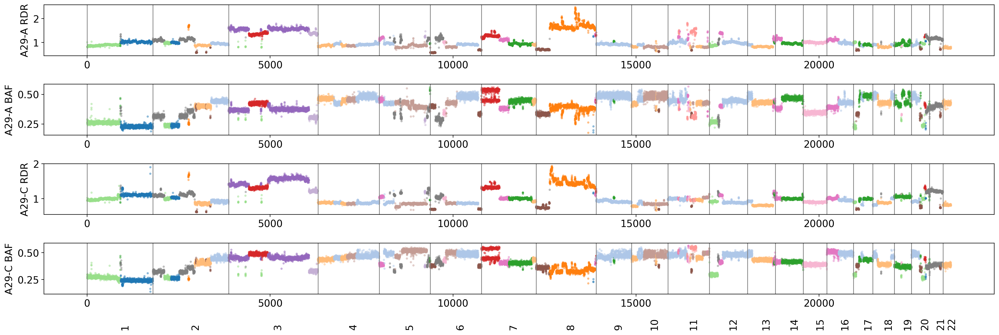

In [6]:
fig, axes = plt.subplots(4, 1, figsize=(20,7), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A29_copynumberstates.pdf", bbox_inches="tight")
fig.show()


/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(*args, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' 

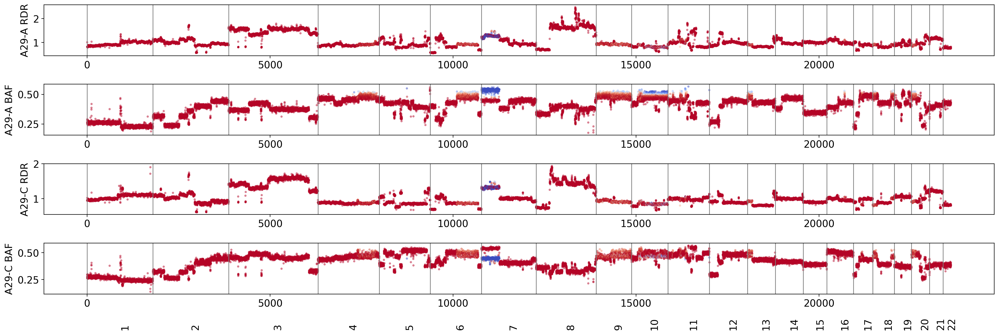

In [7]:
phase_prob = np.exp( scipy.special.logsumexp(res["log_gamma"][:n_states,:], axis=0) )

fig, axes = plt.subplots(4, 1, figsize=(20,7), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], hue=phase_prob, palette="coolwarm", vmin=0, vmax=1, legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], hue=phase_prob, palette="coolwarm", vmin=0, vmax=1, legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A29_phases.pdf", bbox_inches="tight")
fig.show()


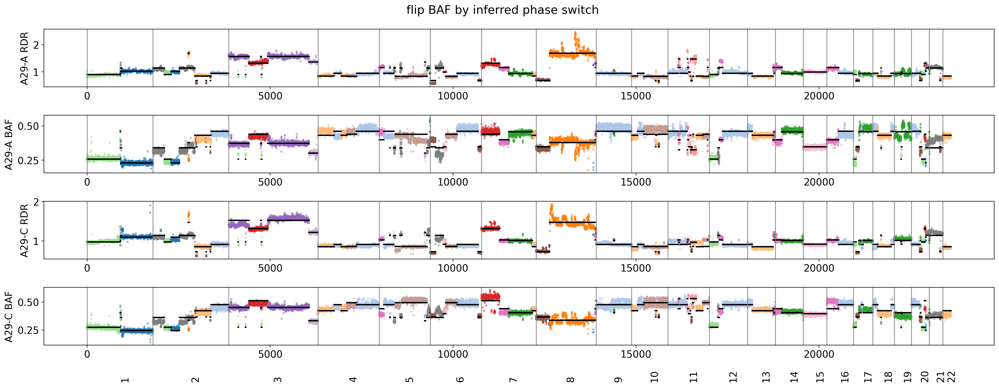

In [9]:
idx = np.where(phase_prob < 0.5)[0]

updated_X = copy.copy(X)
updated_X[idx, 1, :] = 1 - updated_X[idx, 1, :]


segments, labs = get_intervals(res["pred_cnv"])

fig, axes = plt.subplots(4, 1, figsize=(20,8), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(updated_X.shape[0]), y=updated_X[:,0,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    for i, seg in enumerate(segments):
        axes[2*s].plot(seg, [res["new_rdr_mean"][labs[i],s], res["new_rdr_mean"][labs[i],s]], c="black", linewidth=2)
    seaborn.scatterplot(x=np.arange(updated_X.shape[0]), y=updated_X[:,1,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")
    for i, seg in enumerate(segments):
        axes[2*s+1].plot(seg, [res["new_p_mean"][labs[i],s], res["new_p_mean"][labs[i],s]], c="black", linewidth=2)

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.suptitle("flip BAF by inferred phase switch")
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A29_flipbyphase.pdf", bbox_inches="tight")

fig.show()


# A31

In [10]:
##### load another data #####
dir = "/n/fs/ragr-research/projects/hatchet2-results/gundem/A31/"

unique_chrs = np.arange(1, 23)

df_all = pd.read_csv(f"{dir}/bb/bulk.bb", header=0, sep="\t")
df_all.iloc[:,0] = pd.Categorical(df_all.iloc[:,0], categories=unique_chrs, ordered=True)
df_all.sort_values(by=["#CHR", "START"], inplace=True)
df_all

,#CHR,START,END,SAMPLE,RD,#SNPS,COV,ALPHA,BETA,BAF,TOTAL_READS,NORMAL_READS,CORRECTED_READS
0,1,1,930959,A31-A,0.951728,115,43.765217,3219,1814,0.360726,227407.0,141284.0,134464.0
1,1,1,930959,A31-C,0.988760,115,50.121739,3062,2702,0.468452,252882.0,141284.0,139696.0
2,1,1,930959,A31-D,0.942605,115,48.486957,3490,2086,0.373522,245469.0,141284.0,133175.0
3,1,1,930959,A31-E,1.005061,115,51.886957,3823,2144,0.359618,274178.0,141284.0,141999.0
4,1,1,930959,A31-F,1.012613,115,54.782609,3983,2317,0.367990,267413.0,141284.0,143066.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
57025,22,50971388,51304567,A31-A,0.983031,162,49.030864,4296,3647,0.462897,139905.0,84153.0,82725.0
57026,22,50971388,51304567,A31-C,0.963507,162,51.808642,4420,3973,0.476388,146778.0,84153.0,81082.0
57027,22,50971388,51304567,A31-D,1.105189,162,60.814815,5145,4707,0.479315,171428.0,84153.0,93005.0
57028,22,50971388,51304567,A31-E,1.162941,162,63.327160,5371,4888,0.479330,188963.0,84153.0,97865.0


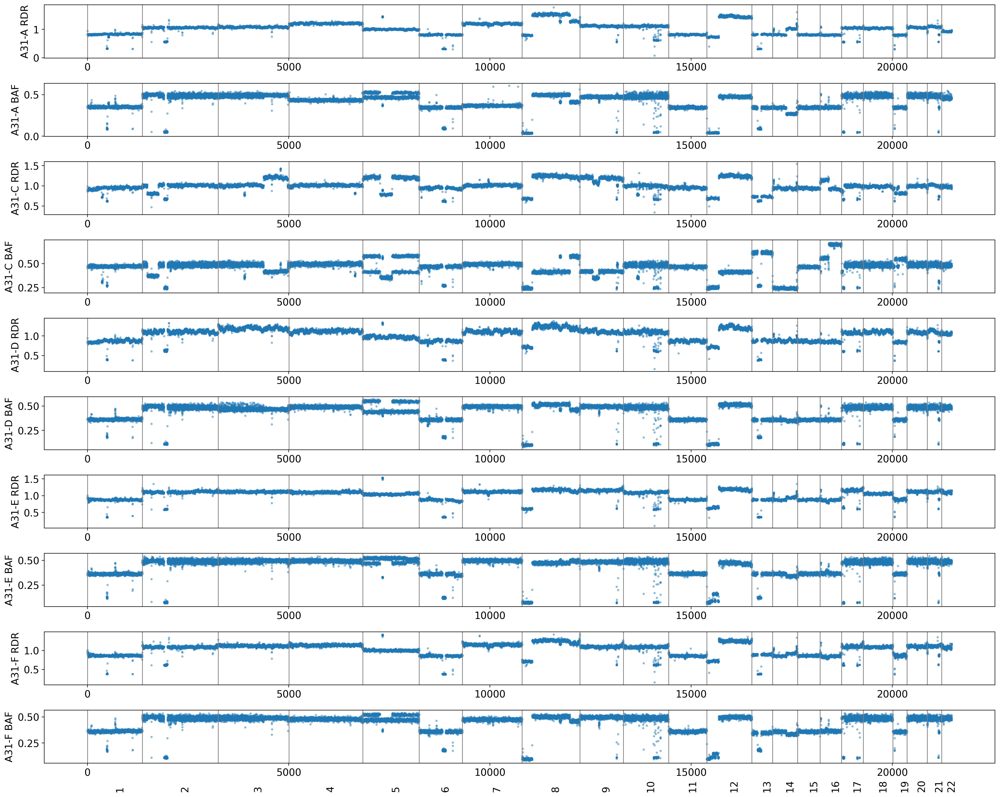

In [11]:
sample_list = np.unique(df_all["SAMPLE"].values)
n_samples = len(sample_list)

X = np.zeros((df_all[df_all["SAMPLE"] == sample_list[0]].shape[0], 2, n_samples))
for s,sname in enumerate(sample_list):
    X[:,0,s] = df_all[df_all["SAMPLE"] == sname].RD.values
    X[:,1,s] = df_all[df_all["SAMPLE"] == sname].BAF.values


log_sitewise_transmat = np.ones(X.shape[0]) * np.log(0.5)

lengths = np.array([np.sum(df_all[df_all["SAMPLE"] == sample_list[0]]["#CHR"] == c) for c in unique_chrs])

fig, axes = plt.subplots(10, 1, figsize=(20,16), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.show()


In [12]:
# running HMM

n_states = 15
params="smp"
t = 1-1e-12

res = pipeline_gaussian_baum_welch(X, lengths, n_states, log_sitewise_transmat, params=params, t=t, random_state=0, \
    shared_rdr_std=True, shared_p_std=True, init_rdr_mean=None, init_p_mean=None, init_rdr_std=None, init_p_std=None, \
    max_iter=50, tol=1e-4)

/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/sklearn/mixture/_base.py:286: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


init_log_mu = [[1.07096692 0.99935651 1.08728309 1.11950742 1.10070522]
 [0.90859201 0.93132168 0.88246683 0.90797928 0.88738849]
 [0.81853553 0.95797991 0.86618922 0.87465584 0.86033272]
 [1.28175078 1.20170083 1.17638042 1.12026019 1.18911389]
 [0.7121624  0.68405199 0.68940123 0.61944554 0.68985605]
 [1.00171657 1.20792714 0.97046911 1.04554414 1.00082878]
 [1.20283579 1.01469425 1.11754209 1.10699645 1.14327482]
 [0.32200183 0.62884401 0.39792569 0.370386   0.38627909]
 [1.10670338 1.19349162 1.13865425 1.13993378 1.10473046]
 [1.0372319  0.79866821 1.03078539 1.07016513 1.04468082]
 [1.52101795 1.23247173 1.25438449 1.18984183 1.26430123]
 [1.48141591 1.24673128 1.22865643 1.1797076  1.25267666]
 [0.8121771  0.81604407 0.86097568 0.88027152 0.87312642]
 [1.08812877 1.0181258  1.16912881 1.10003993 1.10815628]
 [1.00366332 0.94942683 1.07410776 1.07265665 1.07875357]]
init_p_mean = [[0.47881796 0.49256718 0.49207159 0.49146374 0.4922007 ]
 [0.31237648 0.25073631 0.35490524 0.352154

  2%|██▌                                                                                                                           | 1/50 [00:02<02:15,  2.77s/it]

0.05683103883831704 0.0 0.009467507513765547 0.006770708732336939
[[1.06704012 0.99252996 1.0967418  1.11103489 1.09578139 0.49761781
  0.49731179 0.49838479 0.49819153 0.49841601]
 [0.9136027  0.94016347 0.88444117 0.9103696  0.88941674 0.31169641
  0.24873917 0.35526837 0.35256214 0.34854051]
 [0.81729608 0.93875991 0.86447799 0.87548449 0.86079885 0.34697068
  0.47340897 0.36121614 0.36206853 0.3609556 ]
 [1.28356124 1.20173371 1.17538974 1.11969772 1.19017578 0.41691449
  0.56997659 0.46552653 0.49526715 0.46271522]
 [0.71235629 0.68459386 0.68964629 0.62010039 0.6903611  0.04535891
  0.24957142 0.10976989 0.09028645 0.11225961]
 [1.00164068 1.20757856 0.97037476 1.04551495 1.0008586  0.47542042
  0.56756808 0.45449452 0.5170218  0.47790379]
 [1.19568078 1.01405327 1.11176625 1.11337286 1.14893356 0.38509046
  0.49632664 0.49675011 0.49677021 0.47828929]
 [0.31856385 0.6271716  0.39550047 0.36644959 0.38274623 0.09339919
  0.27161174 0.18159485 0.12334952 0.18217504]
 [1.12330837 1

  4%|█████                                                                                                                         | 2/50 [00:05<02:14,  2.80s/it]

0.03268591153795867 0.0 0.006994468314078333 0.004502233749024711
[[1.06784729 0.98697654 1.09856329 1.10626007 1.09602826 0.49616751
  0.49458686 0.49616589 0.49562499 0.49617962]
 [0.90965896 0.93291202 0.88324937 0.90885209 0.88806732 0.3128028
  0.24996769 0.35553146 0.35282728 0.34887874]
 [0.81847247 0.95719751 0.86604819 0.87452493 0.86024006 0.34769288
  0.47373685 0.36179222 0.3631964  0.3619521 ]
 [1.28233196 1.20104216 1.17654216 1.12036646 1.18914285 0.41075221
  0.57339394 0.46245185 0.49428761 0.45953672]
 [0.7121641  0.68403705 0.68939661 0.61943594 0.68985236 0.04334899
  0.24857871 0.10802892 0.08844084 0.11052589]
 [1.00148998 1.20747466 0.97066813 1.04522574 1.0007053  0.47002635
  0.58113463 0.44480291 0.52017303 0.47299622]
 [1.20268071 1.01373969 1.11748614 1.10688301 1.14314566 0.40377232
  0.49566086 0.49398668 0.49430442 0.47753506]
 [0.317928   0.6278281  0.39430492 0.36648857 0.38235993 0.09534945
  0.27513561 0.18314273 0.12598328 0.18345218]
 [1.10676049 1.

  6%|███████▌                                                                                                                      | 3/50 [00:08<02:10,  2.77s/it]

0.0005054361169678742 0.0 0.00040512456459313855 0.0016505355673756572
[[1.06943559 0.9875524  1.09829466 1.10555916 1.09558467 0.49018377
  0.48516527 0.49062583 0.48913527 0.49056701]
 [0.90960637 0.93276699 0.88321056 0.90877939 0.88802441 0.31277569
  0.25001925 0.35549351 0.3527915  0.34885764]
 [0.81841093 0.95728297 0.86599677 0.87448022 0.86018058 0.34765013
  0.47375784 0.36175679 0.36315955 0.36191213]
 [1.28172749 1.20079496 1.17640818 1.11990812 1.18846531 0.41074528
  0.57332361 0.46240732 0.4942721  0.45950728]
 [0.7121641  0.68403705 0.68939661 0.61943594 0.68985236 0.04334899
  0.24857871 0.10802892 0.08844084 0.11052589]
 [1.00149541 1.20750958 0.97065942 1.04523884 1.00070919 0.47004826
  0.58118193 0.44481749 0.52021164 0.4730146 ]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377969
  0.4956657  0.49398574 0.49429378 0.47752673]
 [0.317928   0.6278281  0.39430492 0.36648857 0.38235993 0.09534945
  0.27513561 0.18314273 0.12598328 0.18345218]
 [1.10674

  8%|██████████                                                                                                                    | 4/50 [00:11<02:07,  2.77s/it]

0.005991640609922138 0.0 0.00028906131716973206 0.0004797649579619052
[[1.06982714 0.98794449 1.09862783 1.10557514 1.09573985 0.48697891
  0.48034638 0.48776109 0.4860649  0.48798234]
 [0.9096436  0.93277686 0.88322147 0.90880472 0.88804334 0.31275409
  0.24998713 0.35548222 0.35278226 0.3488439 ]
 [0.81834704 0.95734711 0.86592497 0.87444088 0.86010471 0.3475254
  0.47377618 0.36165016 0.36305947 0.36180299]
 [1.28205921 1.20082592 1.17653557 1.12025016 1.18893749 0.41075419
  0.57330949 0.46240637 0.49425045 0.45949283]
 [0.71216414 0.68403703 0.68939662 0.61943589 0.68985235 0.04334889
  0.24857868 0.10802884 0.08844077 0.11052582]
 [1.00163751 1.2078233  0.97037235 1.04550523 1.00084247 0.47014393
  0.58150396 0.44484183 0.52039635 0.47311993]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377962
  0.49566581 0.49398578 0.49429389 0.47752677]
 [0.317928   0.6278281  0.39430492 0.36648857 0.38235993 0.09534945
  0.27513561 0.18314273 0.12598328 0.18345218]
 [1.1067551

 10%|████████████▌                                                                                                                 | 5/50 [00:13<02:04,  2.77s/it]

0.0008673941959756154 0.0 0.001227427331457407 0.0004793533681661003
[[1.0706367  0.98840942 1.09931316 1.10541566 1.09570681 0.48664122
  0.48006194 0.48740447 0.48592718 0.48786731]
 [0.90931669 0.93250497 0.88294047 0.90856024 0.88783143 0.312608
  0.25002197 0.35534318 0.35260796 0.34870404]
 [0.81833601 0.95734503 0.86591488 0.87443241 0.86009601 0.3475216
  0.47377376 0.36164641 0.36305504 0.36179957]
 [1.2902227  1.18559042 1.18372602 1.1397836  1.19966458 0.40881682
  0.57281128 0.45963268 0.4859665  0.45514618]
 [0.71224397 0.68398307 0.68941702 0.61931705 0.68981331 0.04312099
  0.24850963 0.10783218 0.08825628 0.11033892]
 [1.00163757 1.2078234  0.97037226 1.04550532 1.00084252 0.47013158
  0.58148073 0.44483283 0.52037202 0.47310861]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377972
  0.49566562 0.49398571 0.49429372 0.4775267 ]
 [0.31792804 0.6278281  0.39430496 0.36648861 0.38235996 0.09534947
  0.27513562 0.18314275 0.1259833  0.1834522 ]
 [1.10675634 1

 12%|███████████████                                                                                                               | 6/50 [00:16<02:02,  2.78s/it]

0.0001866161237447414 0.0 0.00023786105118340413 0.00011308230570856928
[[1.07114448 0.98890415 1.0997735  1.1053584  1.09590127 0.48655058
  0.48014746 0.48729134 0.48603794 0.48784768]
 [0.90927416 0.93246599 0.88290674 0.90852732 0.88780433 0.31259532
  0.25002873 0.3553288  0.35259089 0.3486905 ]
 [0.8182688  0.95729916 0.86583218 0.87436367 0.86002674 0.34747581
  0.47376053 0.36161004 0.3630138  0.36175942]
 [1.29026531 1.18559284 1.18373124 1.1398316  1.19972772 0.40882292
  0.57281201 0.45963882 0.48596832 0.45515103]
 [0.71235291 0.68398333 0.68948857 0.61932155 0.68988985 0.04286411
  0.24840074 0.10761248 0.08803277 0.11013273]
 [1.00163581 1.20782304 0.97037128 1.045503   1.00084076 0.4701239
  0.58146538 0.44482755 0.52035639 0.47310153]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377967
  0.49566573 0.49398573 0.49429384 0.47752673]
 [0.31793306 0.62782895 0.3943088  0.36649249 0.38236387 0.09535174
  0.27513654 0.18314419 0.12598541 0.18345351]
 [1.10675

 14%|█████████████████▋                                                                                                            | 7/50 [00:19<01:59,  2.78s/it]

5.2901710533376684e-05 0.0 0.00010775609095370342 4.805783310376316e-05
[[1.0714492  0.98912    1.10006633 1.1052854  1.09592511 0.48652546
  0.48023293 0.48726059 0.48609719 0.48783698]
 [0.90927587 0.93246602 0.88290654 0.90852788 0.88780451 0.31259324
  0.25002768 0.35532755 0.35258946 0.34868896]
 [0.81823956 0.95730575 0.86580376 0.8743475  0.86000659 0.34745827
  0.4737674  0.3615937  0.36299713 0.36174353]
 [1.29026533 1.18559285 1.18373123 1.13983161 1.1997277  0.40882292
  0.57281198 0.45963881 0.48596831 0.45515102]
 [0.71235916 0.68398362 0.68949284 0.61932242 0.68989472 0.04284957
  0.24839444 0.10760006 0.08802004 0.11012108]
 [1.0016278  1.20782141 0.97036681 1.04549242 1.00083273 0.47012226
  0.58145829 0.44482777 0.52035084 0.47309986]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377966
  0.49566574 0.49398573 0.49429386 0.47752674]
 [0.31793266 0.62782888 0.39430849 0.36649218 0.38236356 0.09535156
  0.27513647 0.18314407 0.12598524 0.1834534 ]
 [1.1067

 14%|█████████████████▋                                                                                                            | 7/50 [00:22<02:16,  3.17s/it]

5.2132286735275445e-06 0.0 7.101283872500862e-05 1.5005644335488733e-05
[[1.07180209 0.98939268 1.10046208 1.1051603  1.09592234 0.48651093
  0.48032791 0.4872566  0.48614604 0.48782609]
 [0.90927681 0.93246664 0.88290704 0.90852862 0.88780506 0.31259301
  0.25002732 0.3553275  0.35258942 0.34868886]
 [0.81823057 0.9573086  0.86579589 0.87434307 0.86000121 0.3474536
  0.47376864 0.36158871 0.36299221 0.36173905]
 [1.29026533 1.18559286 1.18373122 1.13983161 1.1997277  0.40882293
  0.57281197 0.45963881 0.48596831 0.45515102]
 [0.71235944 0.68398363 0.68949303 0.61932246 0.68989494 0.04284891
  0.24839415 0.10759949 0.08801946 0.11012055]
 [1.00162333 1.2078205  0.97036431 1.0454865  1.00082824 0.47012171
  0.58145502 0.44482816 0.52034845 0.47309927]
 [1.20258533 1.01366305 1.11742148 1.10675694 1.14301073 0.40377966
  0.49566575 0.49398573 0.49429387 0.47752674]
 [0.31793252 0.62782885 0.39430838 0.36649207 0.38236345 0.0953515
  0.27513644 0.18314403 0.12598518 0.18345337]
 [1.106754

### save results and plotting

In [13]:
np.savez("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A31_hmmparams.npz", **res)

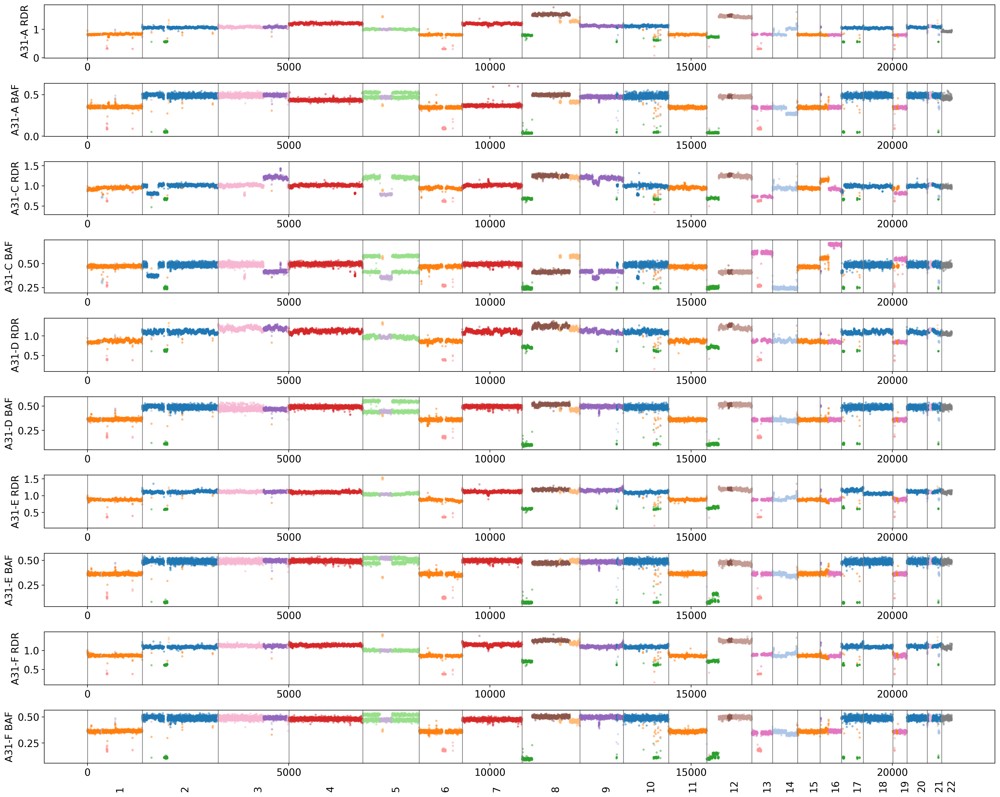

In [15]:
fig, axes = plt.subplots(2*n_samples, 1, figsize=(20,3.2*n_samples), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A31_copynumberstates.pdf", bbox_inches="tight")
fig.show()


/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(*args, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/u/congma/ragr-data/users/congma/environments/miniconda3/envs/py310/lib/python3.10/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' 

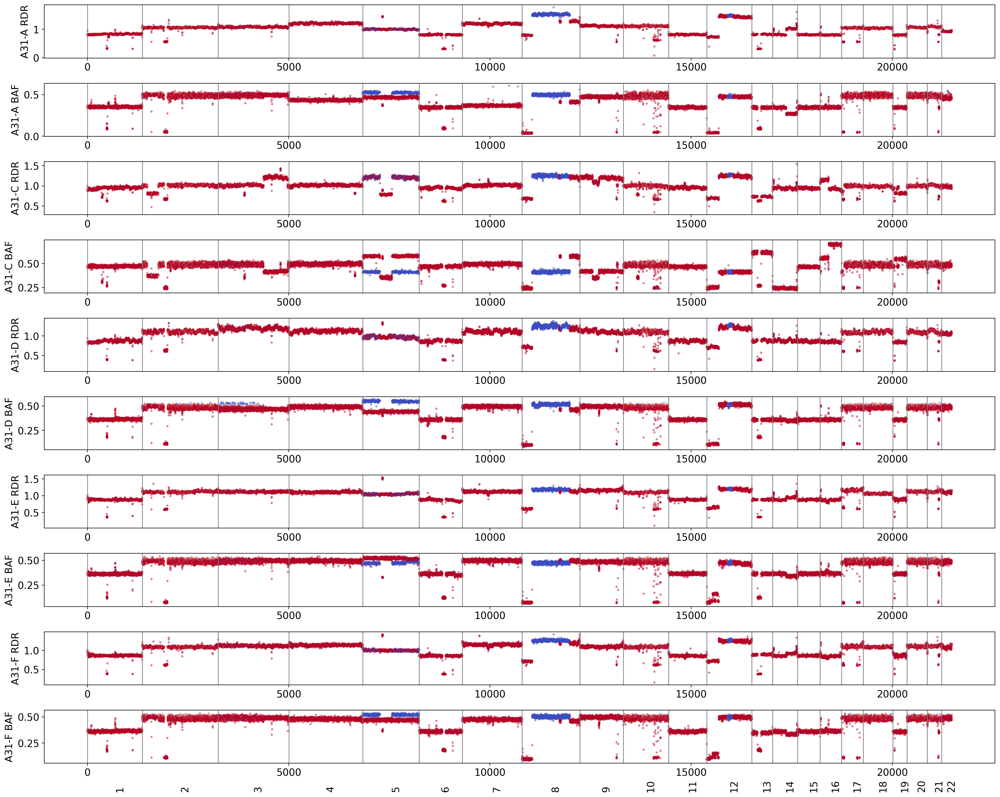

In [16]:
phase_prob = np.exp( scipy.special.logsumexp(res["log_gamma"][:n_states,:], axis=0) )

fig, axes = plt.subplots(2*n_samples, 1, figsize=(20, 3.2*n_samples), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,0,s], hue=phase_prob, palette="coolwarm", vmin=0, vmax=1, legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    seaborn.scatterplot(x=np.arange(X.shape[0]), y=X[:,1,s], hue=phase_prob, palette="coolwarm", vmin=0, vmax=1, legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A31_phases.pdf", bbox_inches="tight")
fig.show()


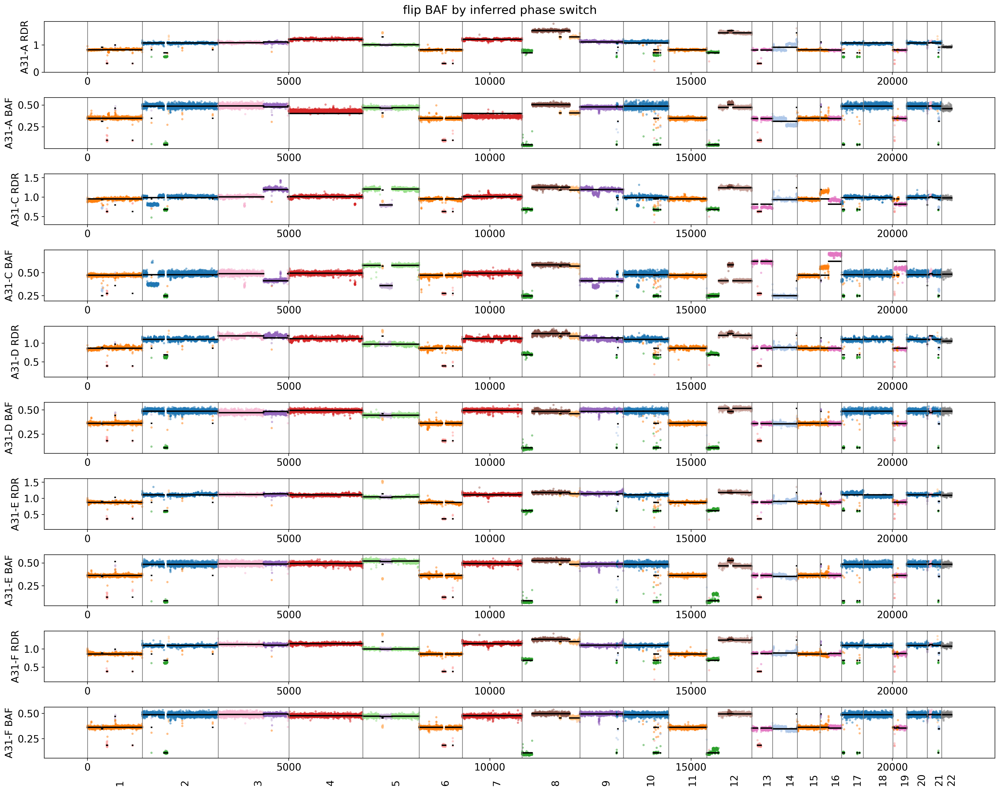

In [17]:
idx = np.where(phase_prob < 0.5)[0]

updated_X = copy.copy(X)
updated_X[idx, 1, :] = 1 - updated_X[idx, 1, :]


segments, labs = get_intervals(res["pred_cnv"])

fig, axes = plt.subplots(2*n_samples, 1, figsize=(20, 3.2*n_samples), dpi=200, facecolor="white")
for s,sname in enumerate(sample_list):
    seaborn.scatterplot(x=np.arange(updated_X.shape[0]), y=updated_X[:,0,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s])
    axes[2*s].set_ylabel(f"{sname} RDR")
    for i, seg in enumerate(segments):
        axes[2*s].plot(seg, [res["new_rdr_mean"][labs[i],s], res["new_rdr_mean"][labs[i],s]], c="black", linewidth=2)
    seaborn.scatterplot(x=np.arange(updated_X.shape[0]), y=updated_X[:,1,s], hue=res["pred_cnv"], palette="tab20", legend=False, s=10, linewidth=0, alpha=0.5, ax=axes[2*s+1])
    axes[2*s+1].set_ylabel(f"{sname} BAF")
    for i, seg in enumerate(segments):
        axes[2*s+1].plot(seg, [res["new_p_mean"][labs[i],s], res["new_p_mean"][labs[i],s]], c="black", linewidth=2)

for i in range(len(lengths)):
    median_len = (np.sum(lengths[:(i)]) + np.sum(lengths[:(i+1)])) / 2
    axes[-1].text(median_len, -0.2, unique_chrs[i], rotation=90)
    for k in range(2*n_samples):
        axes[k].axvline(x=np.sum(lengths[:(i)]), c="grey", linewidth=1)
fig.suptitle("flip BAF by inferred phase switch")
fig.tight_layout()
fig.savefig("/u/congma/ragr-data/users/congma/Codes/locality-clustering-cnv/example/A31_flipbyphase.pdf", bbox_inches="tight")

fig.show()
